# The COG-UK Newick File

Subsetting the COG-UK Newick tree to just NORW sequences, then further slicing by date range and lineage to generate different subtrees.

# Setup

In [1]:
library(phangorn)
library(ggtreeExtra)
library(ggtree)
library(ggnewscale)
library(colorspace);
library(RColorBrewer);
library(dplyr)
library(tidyr)
library(ggplot2)
library (ggpubr)
library (stringr)
library(castor)
library(lubridate)
library(scales)

Loading required package: ape

code for methods in class “Rcpp_Fitch” was not checked for suspicious field assignments (recommended package ‘codetools’ not available?)

code for methods in class “Rcpp_Fitch” was not checked for suspicious field assignments (recommended package ‘codetools’ not available?)

ggtreeExtra v1.4.1  For help: https://yulab-smu.top/treedata-book/

If you use ggtreeExtra in published research, please cite the paper:

S Xu, Z Dai, P Guo, X Fu, S Liu, L Zhou, W Tang, T Feng, M Chen, L Zhan, T Wu, E Hu, Y Jiang, X Bo, G Yu. ggtreeExtra: Compact visualization of richly annotated phylogenetic data. Molecular Biology and Evolution 2021, 38(9):4039-4042. doi: 10.1093/molbev/msab166



ggtree v3.2.1  For help: https://yulab-smu.top/treedata-book/

If you use ggtree in published research, please cite the most appropriate paper(s):

1. Guangchuang Yu. Using ggtree to visualize data on tree-like structures. Current Protocols in Bioinformatics. 2020, 69:e96. doi:10.1002/cpb

In [2]:
treefile <- "~/Desktop/git_temp/QIB_Internship/data/cog_global_2022-04-18_tree.newick.xz"
metadata <- "~/Desktop/git_temp/QIB_Internship/data/cog_global_2022-04-18_public.csv.xz" 

In [3]:
tre <- read.tree(treefile)
meta <- read.csv(metadata, sep=',')

# Subset tree + metadata for NORW

In [4]:
norw_meta <- meta[grep("England/NORW", meta$sequence_name), ]
nrow(norw_meta)

[1] 33411

Not all samples in the metadata file are also included in the tree, so subset the tree based on the NORW tips in the tree (not in the metadata).

In [5]:
tips <- data.frame(tre$tip.label)
norw_tips <- tips[grep("England/NORW", tips$tre.tip.label), ]
head(norw_tips)

norw_tre <- keep.tip(tre, norw_tips)
print(paste0(Ntip(norw_tre), " tips"))

norw_tre <- midpoint(norw_tre) #reroot
#norw_tre$edge.length <- norw_tre$edge.length * 29903 #don't rescale to expected number of snps because 

write.tree(norw_tre, file="NORW_tre.newick")

[1] "England/NORW-EDA56/2020" "England/NORW-EAAA4/2020"
[3] "England/NORW-EE35A/2020" "England/NORW-EE518/2020"
[5] "England/NORW-EB135/2020" "England/NORW-E8244/2020"

[1] "28827 tips"


Also subset traits:

In [6]:
traits <- norw_meta %>% slice(match(norw_tre$tip.label, sequence_name)) #just save the records that appear in the tree
rownames(traits) <- traits$sequence_name

traits <- traits %>% mutate(sample_date=as.POSIXct(sample_date))
traits$date2 <- as.Date(cut(traits$sample_date, breaks = "1 weeks", start.on.monday = TRUE))
traits$sample_date <- as.Date(traits$sample_date)

write.csv(traits, "norw_traits", row.names=FALSE) #save the traits

# Create custom color palette

Make a color palette that includes a color for every lineage in ``norw_traits.csv`` as well as for "B.1.177*", "Delta", "Omicron", and "Other".  Save it as an R object.

In [8]:
traits <- read.csv("norw_traits", sep=',')

unique_lineages <- sort(unique(traits[["lineage"]]))
extra_lineages <- c("B.1.177*", "Delta", "Omicron", "Other") # other names I'll use that need colors too
unique_lineages <- c(unique_lineages, extra_lineages)

getPal_lineage = colorRampPalette(brewer.pal(8,"Dark2"))(length(unique_lineages) + 1)  ## RdYlGn Set2
names(getPal_lineage) = unique_lineages

saveRDS(getPal_lineage, file="~/Desktop/git_temp/QIB_Internship/NORW_lineage_palette.rda")

Check what it looks like:

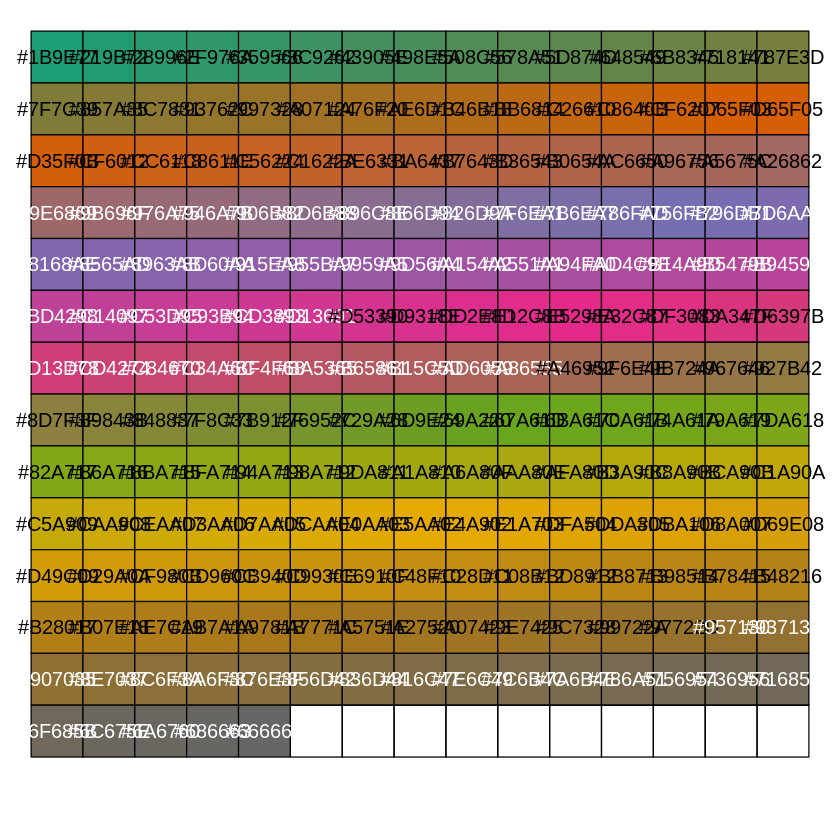

In [11]:
getPal_lineage <- readRDS(file="~/Desktop/git_temp/QIB_Internship/NORW_lineage_palette.rda")
show_col(getPal_lineage)
#pie(rep(1, length(getPal_lineage)), col = getPal_lineage, labels = names(getPal_lineage))
#print(sample(getPal_lineage))

A lot of the colors in this palette are very similar to each other, and it also includes gray, which I don't really want.  The added words are almost all gray, which won't help with telling them apart.

# Combine lineages for rendering the entire NORW tree

Check how many unique lineages are in the CIVET metadata for NORW:

In [2]:
traits <- read.csv("norw_traits", sep=',')

unique_lineages <- sort(unique(traits[["lineage"]]))
print(length(unique_lineages))
table(traits$lineage)

[1] 195



      AD.2       AV.1      AY.10     AY.100     AY.103     AY.104     AY.106 
         3          1         59          2          6          1          1 
    AY.107     AY.109      AY.11     AY.111     AY.112     AY.113     AY.116 
         2         28          2        161         35          1          1 
    AY.118     AY.119     AY.120   AY.120.2     AY.121   AY.121.1     AY.122 
         1          2        384          1         45          4        176 
  AY.123.1     AY.124     AY.125     AY.126     AY.127     AY.128     AY.129 
         1          5         19         18         19          3          1 
     AY.17      AY.20      AY.23      AY.24      AY.25    AY.25.1      AY.29 
         1          4          3          1          5         10          1 
      AY.3      AY.33      AY.34    AY.34.1    AY.34.2      AY.36    AY.36.1 
        20         17         37         34          5         55          8 
     AY.37      AY.39       AY.4     AY.4.1    AY.4.10    AY.4.

195 is too many lineages to see on one plot, so collapse the most common ones:

In [14]:
#rename lineages
traits$lineage <- str_replace_all(traits$lineage, 'AY.*', 'Delta')
traits$lineage <- str_replace_all(traits$lineage, 'B.1.617.2', 'Delta')
#traits$lineage <- str_replace_all(traits$lineage, 'Q.1', 'Alpha')
#traits$lineage <- str_replace_all(traits$lineage, 'B.1.1.7', 'Alpha')
traits$lineage <- str_replace_all(traits$lineage, 'B.1.177.*', 'B.1.177*')
traits$lineage <- str_replace_all(traits$lineage, 'BA.*', 'Omicron')
traits$lineage <- str_replace_all(traits$lineage, 'B.1.1.529', 'Omicron')

#combine all lineages with <40 sequences into "Other"
total_counts <- as.data.frame(table(traits$lineage))
few_seqs <- total_counts$Var1[which(total_counts$Freq < 40)]
few_seqs <- as.character(few_seqs)
traits$lineage[traits$lineage %in% few_seqs] = "Other"

#find out how many unique lineages there are now
table(traits$lineage)


   B.1.1  B.1.1.7 B.1.177*    Delta  Omicron    Other 
      43      467      105    21398     6548      161 

Now it's down to 6 groups.  I had colors for these in `getPal_lineage`, but they were all gray, so...make a new color palette for these:

In [15]:
unique_lineages <- sort(unique(traits[["lineage"]]))
getPal_6 = colorRampPalette(brewer.pal(8,"Dark2"))(length(unique_lineages) + 1)  ## RdYlGn Set2
names(getPal_6) = unique_lineages
getPal_6

B.1.1   B.1.1.7  B.1.177*     Delta   Omicron     Other      <NA> 
"#1B9E77" "#C8611F" "#9B58A5" "#A66753" "#BBA90B" "#B07E18" "#666666"

And include the hexadecimal color codes in `traits` so I can look at the tree in ITOL:

In [16]:
traits$color <- "Cat"
for (name in names(getPal_6)){traits$color[traits$lineage == name] = getPal_6[name]}
head(traits$color)
head(traits$lineage)

[1] "#B07E18" "#B07E18" "#B07E18" "#B07E18" "#B07E18" "#B07E18"

[1] "Other" "Other" "Other" "Other" "Other" "Other"

Finally make a template file for ITOL:

In [17]:
itol_df <- traits[c("sequence_name", "color")] #, "lineage")]
itol_df$clade = "clade"
itol_df$linetype = "normal"
itol_df$int = 1
rownames(itol_df) <- c()

itol_df <- itol_df[, c("sequence_name", "clade", "color", "linetype", "int")]

sequence_name <- c("TREE_COLORS", "SEPARATOR COMMA", "DATA")
df <- data.frame(sequence_name)
for (col in colnames(itol_df)[2:length(itol_df)]){df[col] <- c("", "", "")}

template <- rbind(df, itol_df)

write.table(template, "ITOL_template.txt", sep=',', col.names=FALSE, row.names=FALSE, quote = FALSE)

To finish the template, open up `ITOL_template.txt` and delete all the extra commas after TREE_COLORS, SEPARATOR COMMA, and DATA.

# Viewing the Tree

I tried to render the tree in this notebook using the code below, but it was way too giant for the kernel, so I rendered it in [iTOL](https://itol.embl.de/) instead. 

groupInfo <- split (tre$tip.label, traits["lineage"])
grouptre <- groupOTU(tre, groupInfo, group_name="group1")
options(repr.plot.width=26, repr.plot.height=20) ; par(oma=c(0,0,0,0)) 

p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular") #, mrsd=mrsd)
p <- p + geom_tippoint(size=3, shape=21, aes(fill=group1))
p <- p + scale_color_manual(values = getPal_lineage, name="lineage") + scale_fill_manual(values = getPal_lineage, name="lineage")
p <- p + theme_tree2(text = element_text(size=30))
#p <- p + geom_treescale()
p <- p + theme(legend.position="left", legend.title = element_text(size=30), legend.text=element_text(size=30), legend.key.size = unit(1, 'cm'))
p


![](iTOL_NORW_tre.newick.png)


iTOL collapsed all nodes with 200-500 tips.  Looking at the relative numbers of each lineage, it can be inferred that the brown is Delta, the green-gold is Omicron, and everything else has been collapsed.

In [18]:
table(traits$lineage)


   B.1.1  B.1.1.7 B.1.177*    Delta  Omicron    Other 
      43      467      105    21398     6548      161 

# Viewing the tree in R after subsampling

The Newick tree will be visualizable in R if I make it small enough.  Let's try 10,000 tips.  
Find the 10,000 most diverse tips in the NORW tree:

``iqtree -k 10000 NORW_tre.newick 
grep -A 10000 "The optimal PD set has" NORW_tre.newick.pda | sed '1d' | sed 's/_/\//g' | sort | uniq > reduced_queries.txt``

In [20]:
keep_tips <- readLines('reduced_queries.txt')

Define a tree-plotting function:

In [33]:
plot_date_tree_fan <- function(traits_subset, treefile, source_palette){

norw_tre <- read.tree(treefile)
tre2 <- keep.tip(norw_tre, traits_subset$sequence_name)
print(paste0("Tips in the whole NORW CIVET tree: ", Ntip(norw_tre)))
print(paste0("Tips in this tree: ", Ntip(tre2)))

#create palette for lineages
#unique_lineages <- sort(unique(traits_subset[["lineage"]]))
#getPal_lineage = colorRampPalette(brewer.pal(8,"Dark2"))(length(unique_lineages) + 1)  ## RdYlGn Set2
#names(getPal_lineage) = unique_lineages
#print(getPal_lineage)
my_lineages <- sort(unique(traits_subset[["lineage"]])) 
plot_palette <- source_palette[(intersect(names(source_palette),my_lineages))]

#get tree plotting info
groupInfo <- split (tre2$tip.label, traits_subset["lineage"])
grouptre <- groupOTU(tre2, groupInfo, group_name="group1")
options(repr.plot.width=40, repr.plot.height=40) ; par(oma=c(0,0,0,0)) 

#plot tree
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="fan", open.angle=5) #, mrsd=mrsd)
p <- p + geom_tippoint(size=3, shape=21, aes(fill=group1)) #, show.legend = FALSE)
p <- p + scale_color_manual(values = plot_palette, name="lineage") + scale_fill_manual(values=plot_palette, name="lineage")
#p <- p + theme_tree2(text = element_text(size=30))
#p <- p + geom_treescale()
p <- p + theme(legend.position="bottom", legend.title = element_text(size=40), legend.text=element_text(size=40), legend.key.size = unit(1, 'cm'))
p
#ggsave("subsample_NORW.pdf", width = 50, height = 50, units = "cm", limitsize = FALSE)

}

Plot a tree with the combined lineages, using the 6-color palette:

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 9974"


Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



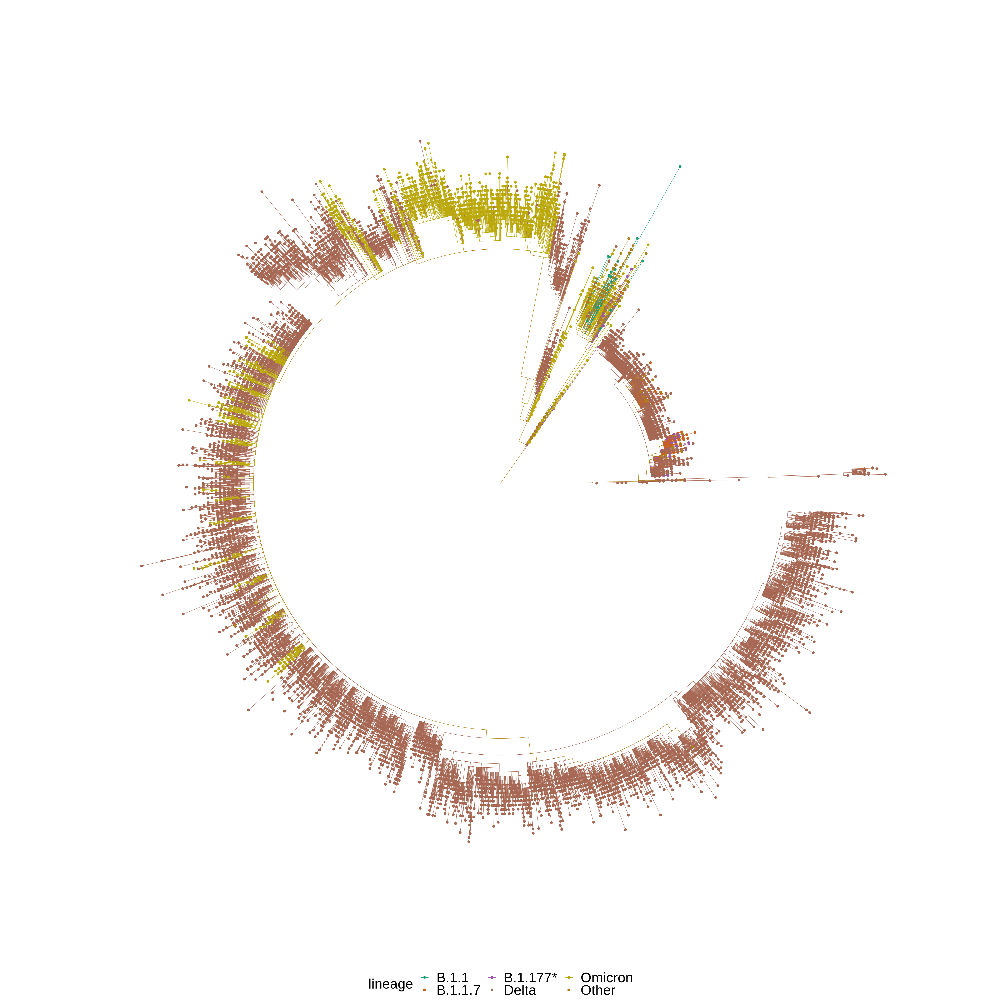

In [34]:
keep_metadata <- traits %>% slice(match(keep_tips, sequence_name)) #traits, already with combined colors
plot_date_tree_fan(keep_metadata, "NORW_tre.newick", getPal_6)

Now a tree with all 195 lineages from the original metadata:

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 9974"


Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



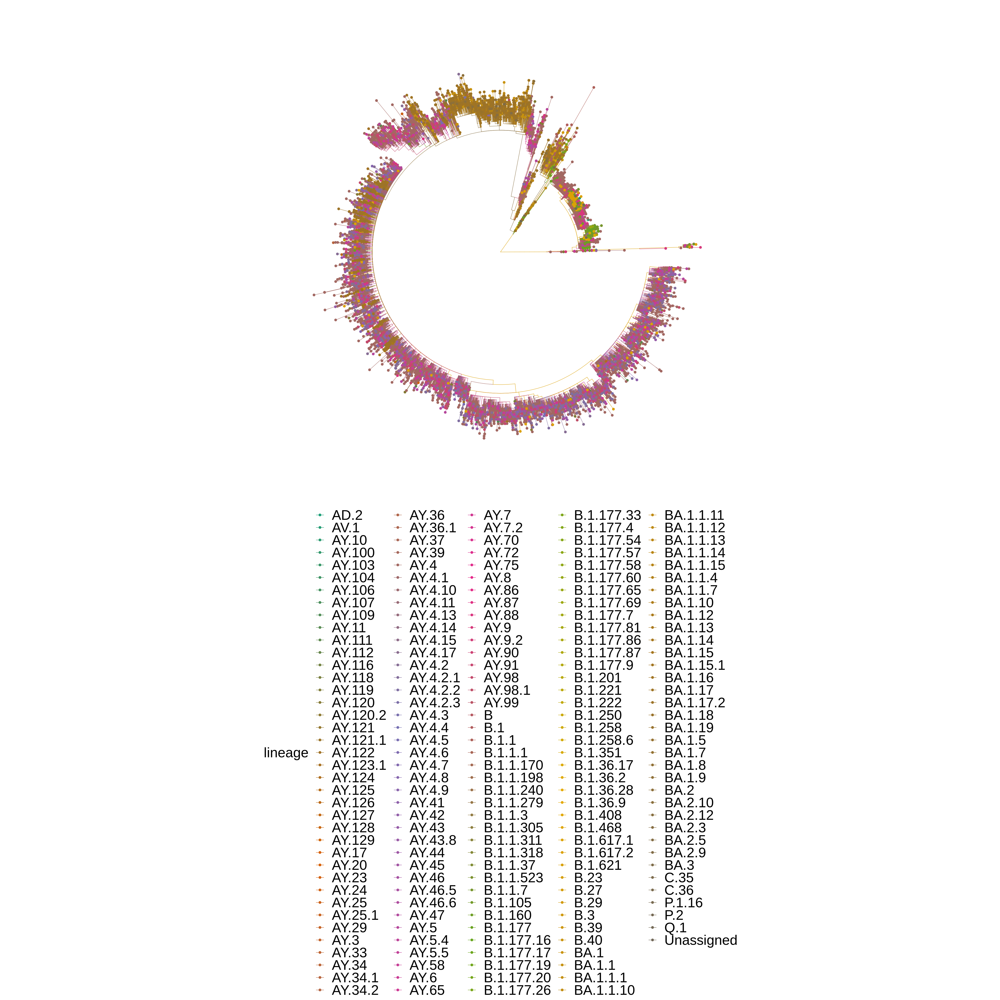

In [35]:
all_colors <- read.csv("norw_traits", sep=',')

keep_metadata <- all_colors %>% slice(match(keep_tips, sequence_name)) #traits, already with combined colors
plot_date_tree_fan(keep_metadata, "NORW_tre.newick", getPal_lineage)

# Subsetting the NORW tree by date and lineage

It might be interesting to slice the CIVET tree by date range and by lineage.

Define functions:

In [114]:
# return a subset of the metadata, with entries that belong to a date range

get_date_subset <- function(start_date, end_date, traits_df){
date_subset <- subset(traits_df, (sample_date >= as.Date(start_date) & sample_date <= as.Date(end_date)))
date_subset$sample_date <- as.Date(date_subset$sample_date)
return(date_subset)
}



# return a subset of the metadata, with entries that belong to a list of lineages

get_lineage_subset <- function(traits_subs, lineages_to_choose){
#lineage_subset <- subset(traits, (lineage == lineage_to_choose))
lineage_subset <- subset(traits_subs, (lineage %in% lineages_to_choose))
return(lineage_subset)  
}



# lump together lineages that appear < {thresh} times

combine_lineages_by_threshold <- function(traits_subset, thresh){
total_counts <- as.data.frame(table(traits_subset$lineage))
few_seqs <- total_counts$Var1[which(total_counts$Freq < thresh)]
few_seqs <- as.character(few_seqs)
traits_subset$lineage[traits_subset$lineage %in% few_seqs] = "Other"
return(traits_subset)
}




# plot a rectangular tree

plot_date_tree <- function(traits_subset, treefile, source_palette){
#subset tree by dates
norw_tre <- read.tree(treefile)
tre2 <- keep.tip(norw_tre, traits_subset$sequence_name)
print(paste0("Tips in the whole NORW CIVET tree: ", Ntip(norw_tre)))
print(paste0("Tips in this tree: ", Ntip(tre2)))

#create palette for lineages
#unique_lineages <- sort(unique(traits_subset[["lineage"]]))
#getPal_lineage = colorRampPalette(brewer.pal(8,"Dark2"))(length(unique_lineages) + 1)  ## RdYlGn Set2
#names(getPal_lineage) = unique_lineages
#print(getPal_lineage)
my_lineages <- sort(unique(traits_subset[["lineage"]])) 
plot_palette <- source_palette[(intersect(names(source_palette),my_lineages))]

#get tree plotting info
groupInfo <- split (tre2$tip.label, traits_subset["lineage"])
grouptre <- groupOTU(tre2, groupInfo, group_name="group1")
options(repr.plot.width=26, repr.plot.height=20) ; par(oma=c(0,0,0,0)) 

#plot tree
p <- ggtree (grouptre,  aes(color=group1),size=0.4, layout="rectangular") #, mrsd=mrsd)
p <- p + geom_tippoint(size=3, shape=21, aes(fill=group1))
p <- p + scale_color_manual(values = plot_palette, name="lineage") + scale_fill_manual(values = plot_palette, name="lineage")
p <- p + theme_tree2(text = element_text(size=50))
#p <- p + geom_treescale()
p <- p + theme(legend.position="left", legend.title = element_text(size=50), legend.text=element_text(size=50), legend.key.size = unit(1, 'cm'))
p
}

Define bar plot functions:

In [108]:
sequence_counts <- function(traits_subset, start_date, end_date, dist){
    
options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))

print(paste0("Total seqs: ", nrow(traits_subset))) 
p <- ggplot(traits_subset, aes(x = sample_date)) + geom_bar(color='firebrick', fill='firebrick')
p <- p + scale_x_date(date_labels = "%b %d\n%Y", date_breaks = dist)
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sample Date") + ylab("Number of Sequences")
p <- p + theme(plot.title = element_text(size=20),
               axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=30)
              )

p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date))
p
}



lineage_counts <- function(traits_subset, start_date, end_date){

total_lineages <- as.data.frame(table(traits_subset$lineage))
num_uniq = length(unique(traits_subset$lineage))
print(paste0(num_uniq, " unique lineages"))    
    
options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))
p <- ggplot(data=total_lineages, mapping = aes(x = Var1, y = Freq)) + ggplot2::geom_bar(stat="identity", color='black', fill='goldenrod')
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Lineage") + ylab("Number of Sequences")
p <- p + theme(plot.title = element_text(size=20),
               axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20, angle = 90, vjust = 0.5, hjust=1),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=30)
              )

p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date))
p
}



lineage_time_proportions <- function(traits_subset, start_date, end_date, source_palette){
options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))
    
my_lineages <- sort(unique(traits_subset[["lineage"]])) 
plot_palette <- source_palette[(intersect(names(source_palette),my_lineages))]
    
p <- ggplot(traits_subset, aes(x = date2, fill=lineage)) + geom_bar(position='fill', color='black')  ## geom_bar()
p <- p + ggplot2::scale_fill_manual(values=plot_palette, name="Lineage")
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sampling Week") + ylab("Proportion of Sequences")
p <- p + scale_x_date(date_labels = "%b \n%Y",date_breaks = "1 month")
p <- p + theme(plot.title = element_text(size=20),
               axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=30), legend.position = 'right'
              )

p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date))
p
}


lineage_time_counts <- function(traits_subset, start_date, end_date, source_palette){
    
options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))
      
my_lineages <- sort(unique(traits_subset[["lineage"]])) 
plot_palette <- source_palette[(intersect(names(source_palette),my_lineages))]
   
p <- ggplot(traits_subset, aes(x = date2, fill=lineage)) + geom_bar(color='black')  ## geom_bar()
p <- p + ggplot2::scale_fill_manual(values=plot_palette, name="Lineage")
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sampling Week") + ylab("Proportion of Sequences")
p <- p + scale_x_date(date_labels = "%b \n%Y",date_breaks = "1 month")
p <- p + theme(plot.title = element_text(size=20),
               axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=30), legend.position = 'right'
              )

p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date))
p
}

# January to June 2020

Same as the tree I made from scratch, to compare the COG-UK tree to that one.

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 94"


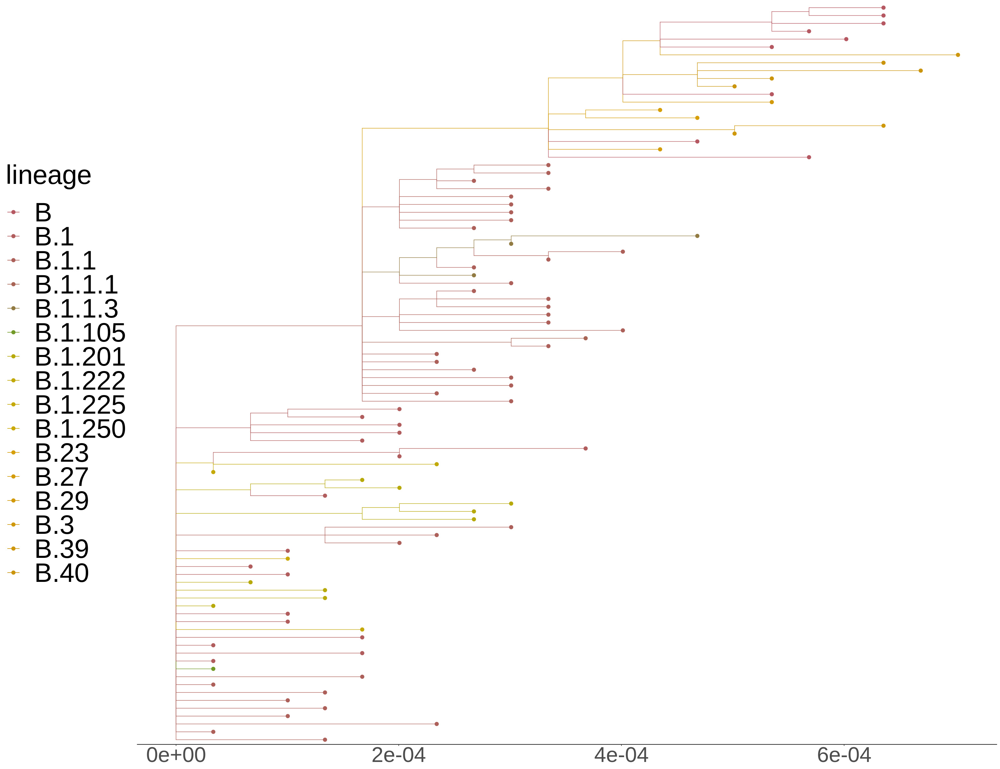

In [79]:
traits <- read.csv("norw_traits", sep=',')
dates <- get_date_subset("2020-01-01", "2020-06-30", traits)

plot_date_tree(dates, "NORW_tre.newick", getPal_lineage)

# B.1.1.7 in NORW

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 467"


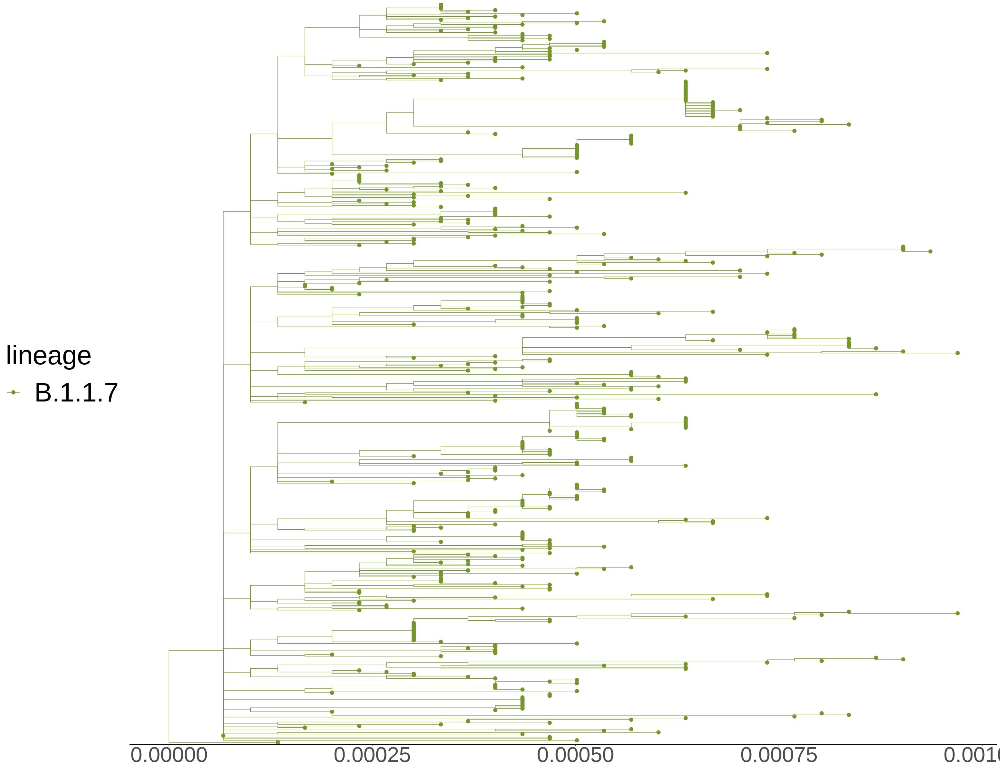

In [80]:
traits <- read.csv("norw_traits", sep=',')
B117 <- get_lineage_subset(traits, list("B.1.1.7"))

plot_date_tree(B117, "NORW_tre.newick", getPal_lineage)

# B.1.1 and B.1.1.7 in NORW

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 510"


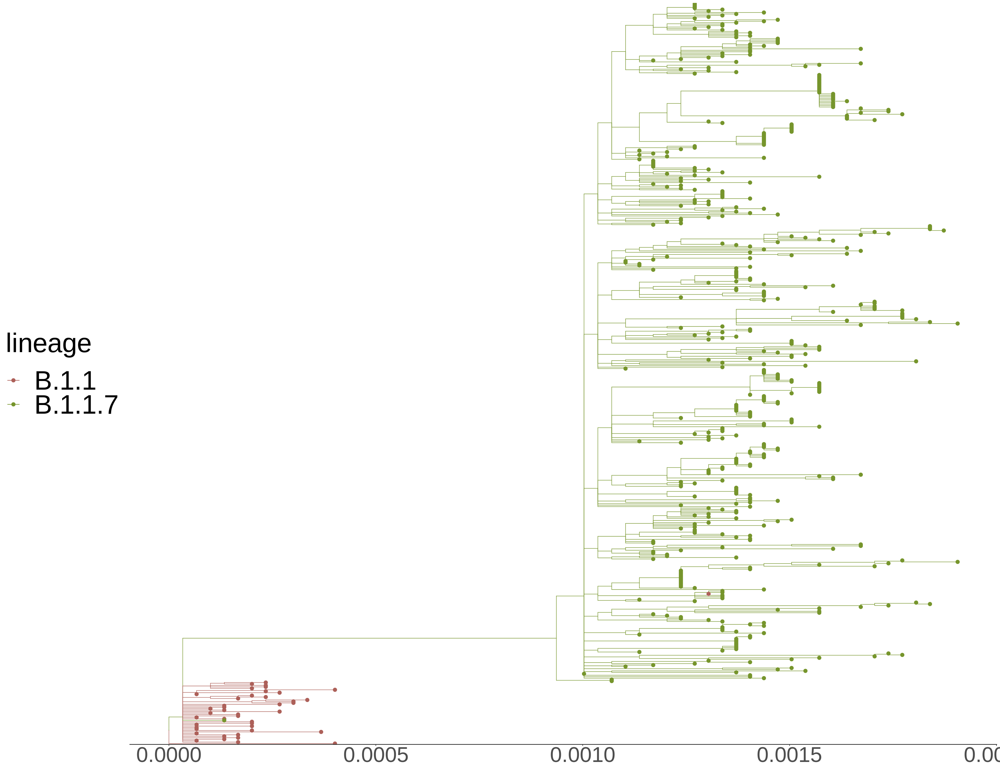

In [81]:
traits <- read.csv("norw_traits", sep=',')
B117_AY4 <- get_lineage_subset(traits, list("B.1.1", "B.1.1.7"))
plot_date_tree(B117_AY4, "NORW_tre.newick", getPal_lineage)

# B.1.1 and B.1.1.7 in NORW from November 1 to December 31, 2020, + bar plots

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 43"
[1] "Total seqs: 43"


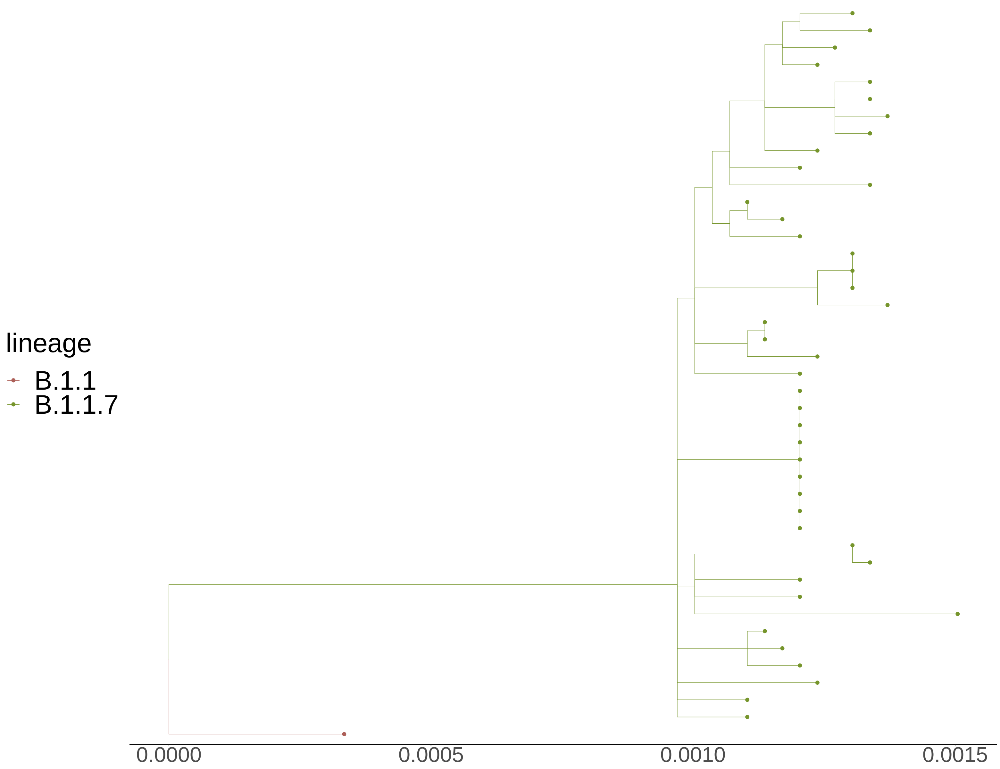

[1] "2 unique lineages"


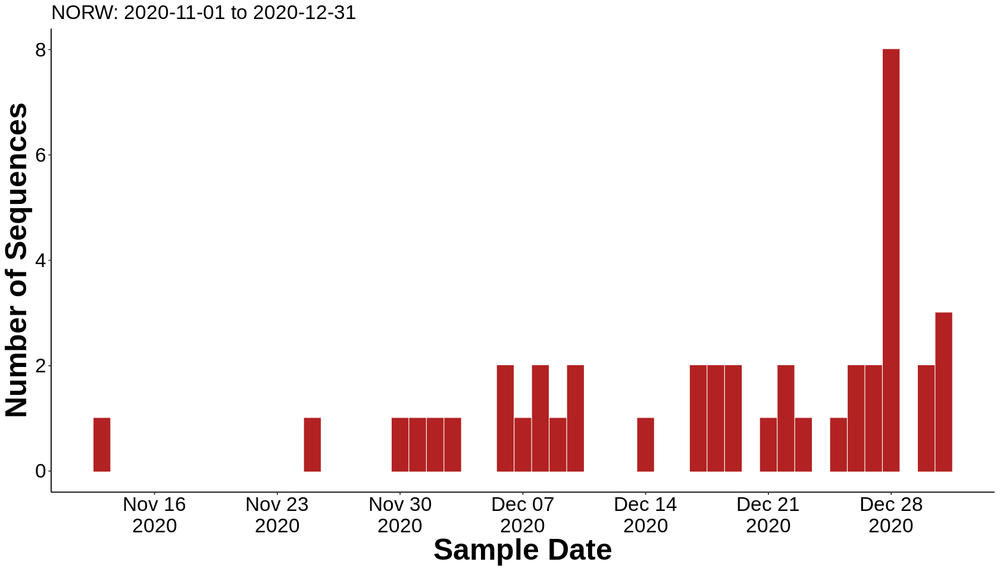

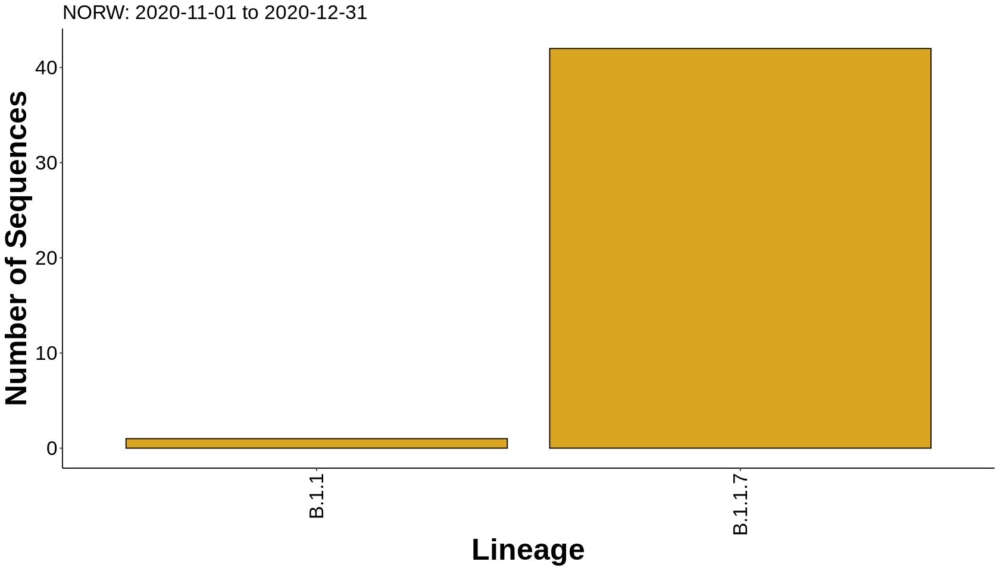

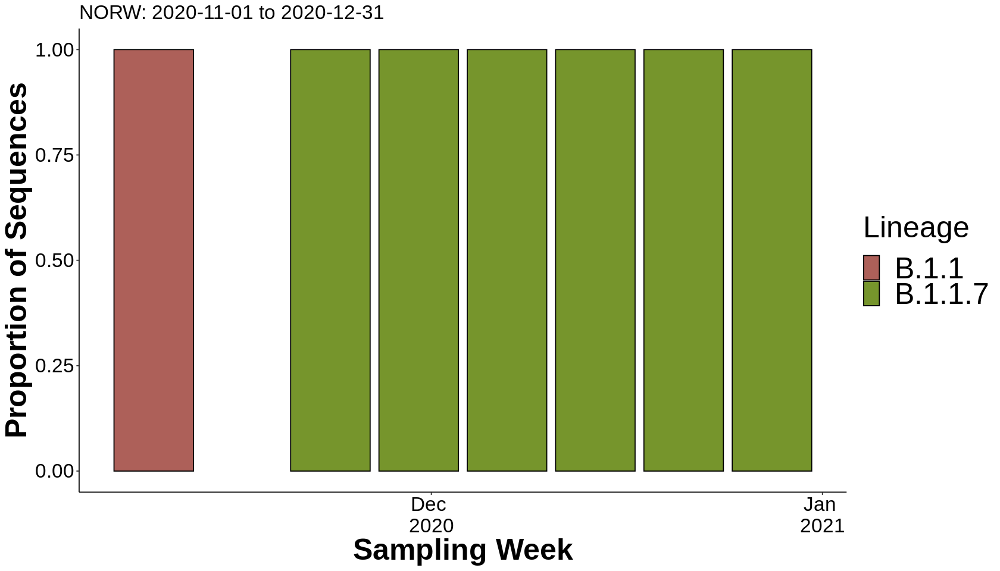

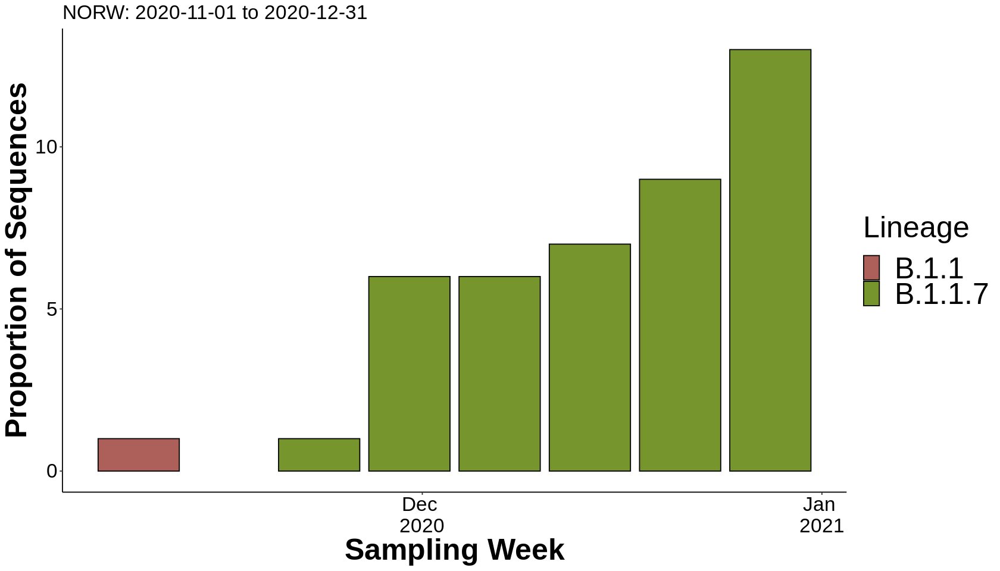

In [109]:
start = "2020-11-01"
end = "2020-12-31"

traits <- read.csv("norw_traits", sep=',')
traits$sample_date <- as.Date(traits$sample_date)
dates <- get_date_subset(start, end, traits)
lineages <- get_lineage_subset(dates, list("B.1.1", "B.1.1.7"))

lineages$date2 <- as.Date(lineages$date2)

plot_date_tree(lineages, "NORW_tre.newick", getPal_lineage)
sequence_counts(lineages, start, end, "1 week")
lineage_counts(lineages, start, end)
lineage_time_proportions(lineages, start, end, getPal_lineage)
lineage_time_counts(lineages, start, end, getPal_lineage)

# Summer 2020

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 4"
[1] "Total seqs: 4"


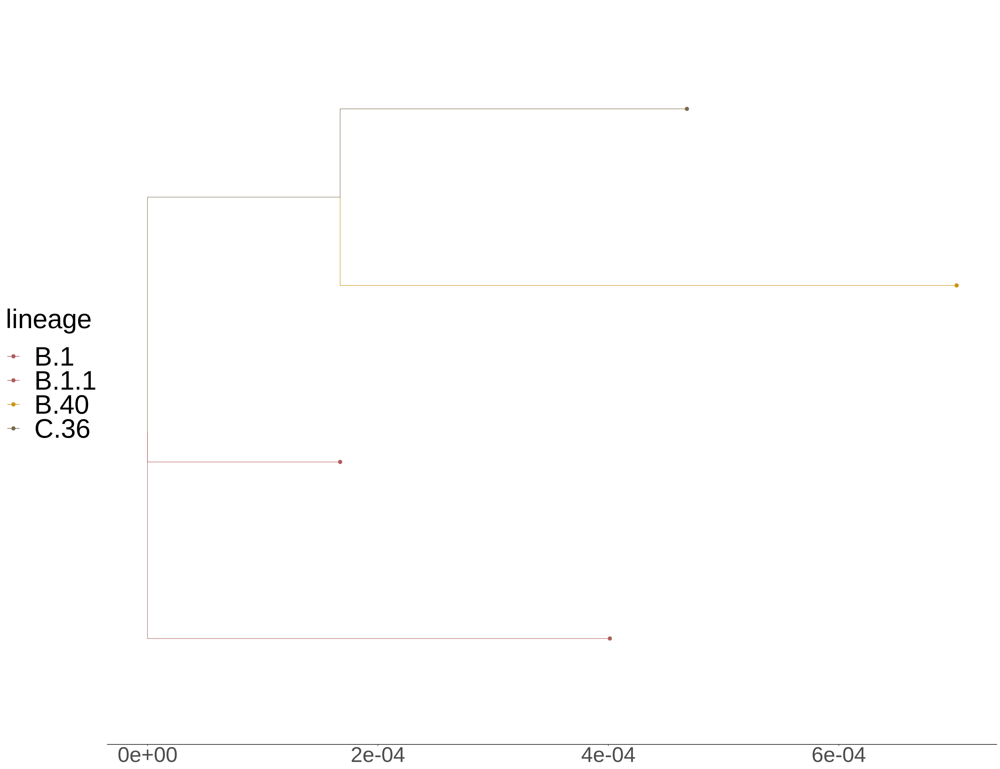

[1] "4 unique lineages"


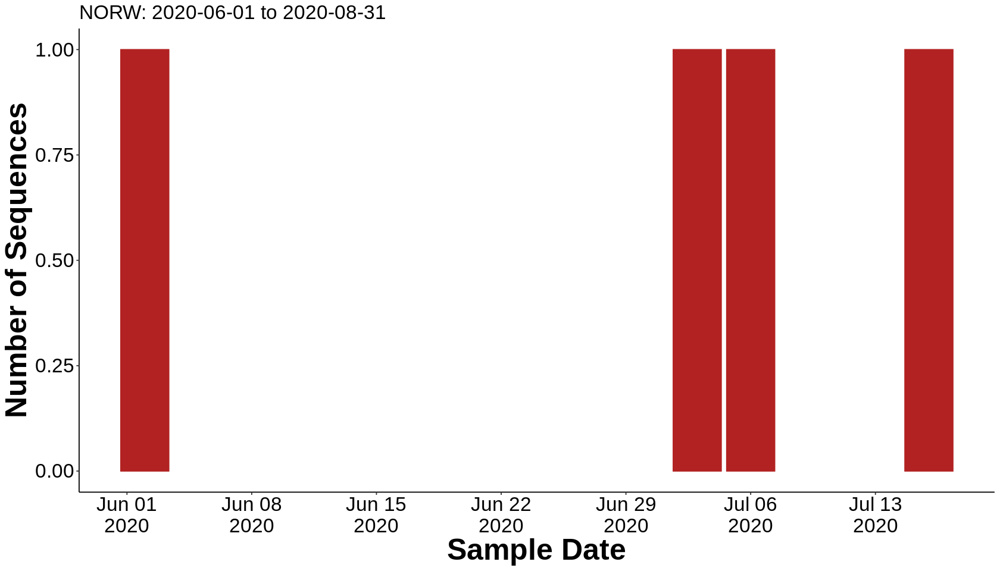

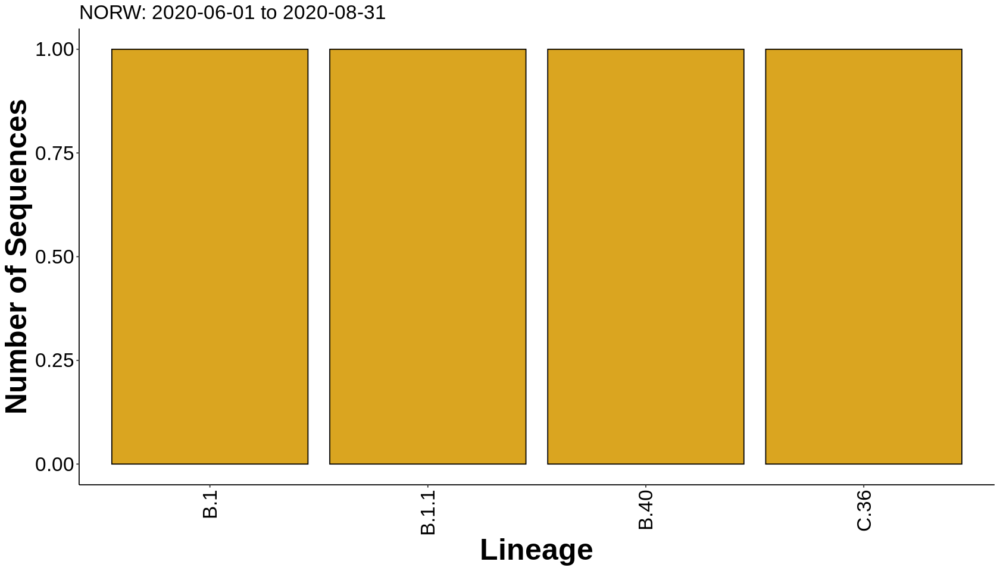

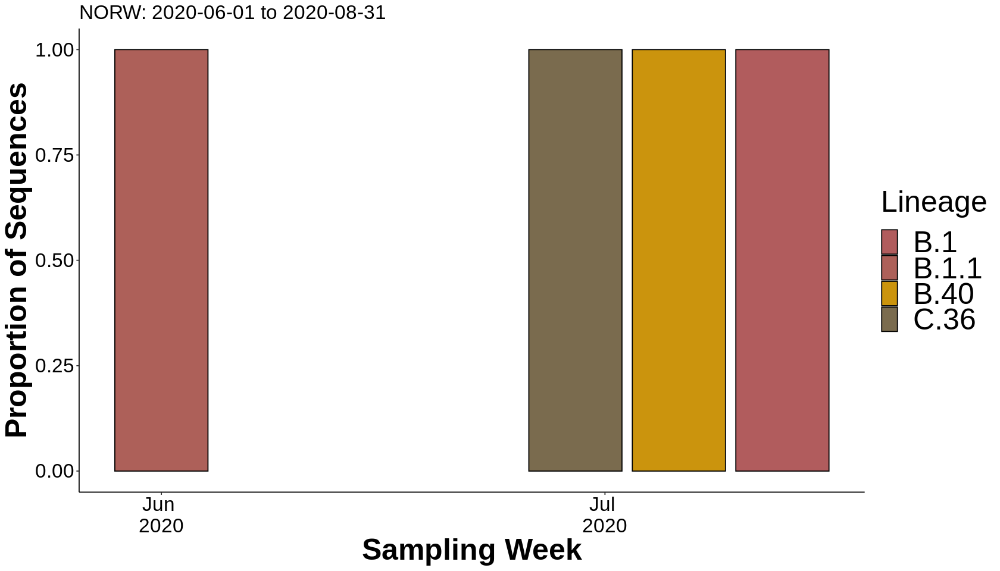

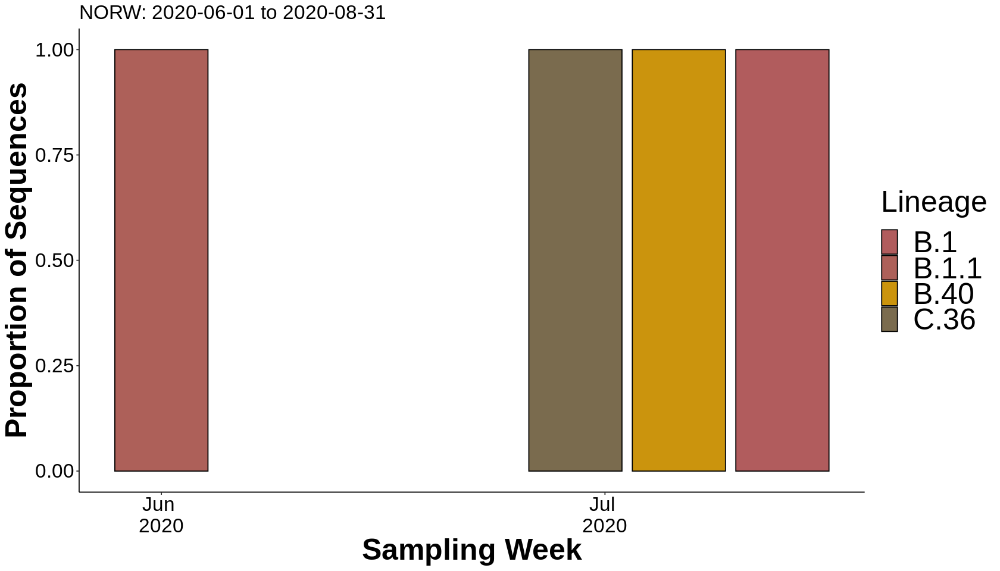

In [110]:
start = "2020-06-01"
end = "2020-08-31"

traits <- read.csv("norw_traits", sep=',')
traits$sample_date <- as.Date(traits$sample_date)
dates <- get_date_subset(start, end, traits)

dates$date2 <- as.Date(dates$date2)

plot_date_tree(dates, "NORW_tre.newick", getPal_lineage)
sequence_counts(dates, start, end, "1 week")
lineage_counts(dates, start, end)
lineage_time_proportions(dates, start, end, getPal_lineage)
lineage_time_counts(dates, start, end, getPal_lineage)

# Summer 2021

[1] "Tips in the whole NORW CIVET tree: 28827"
[1] "Tips in this tree: 6520"
[1] "Total seqs: 6520"


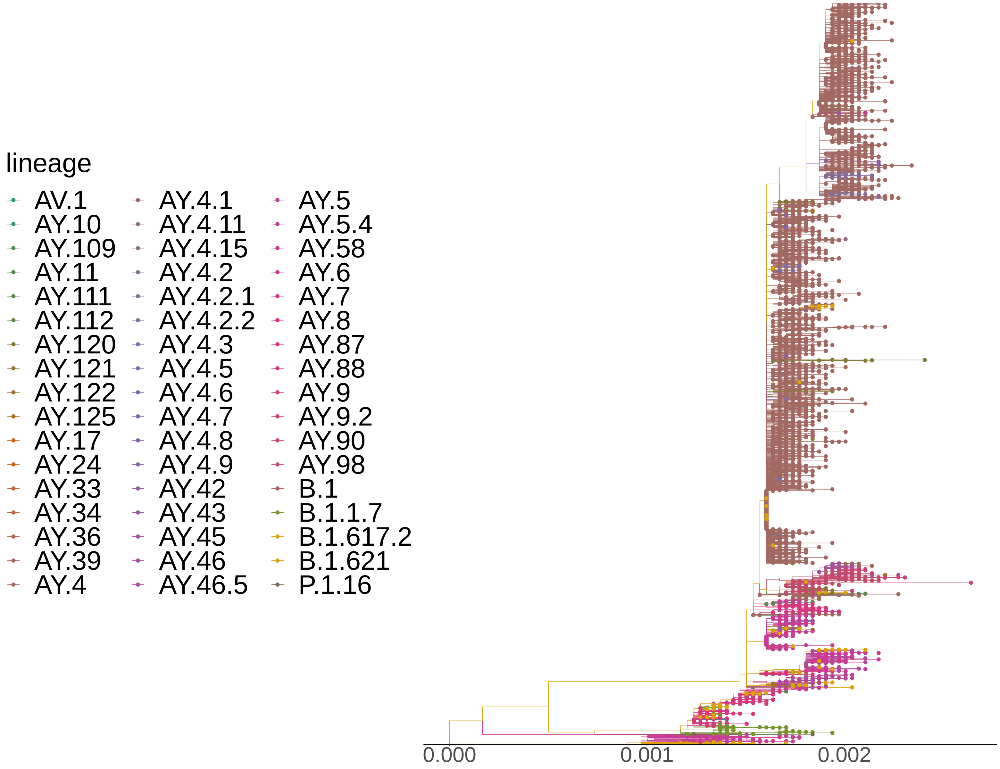

[1] "51 unique lineages"


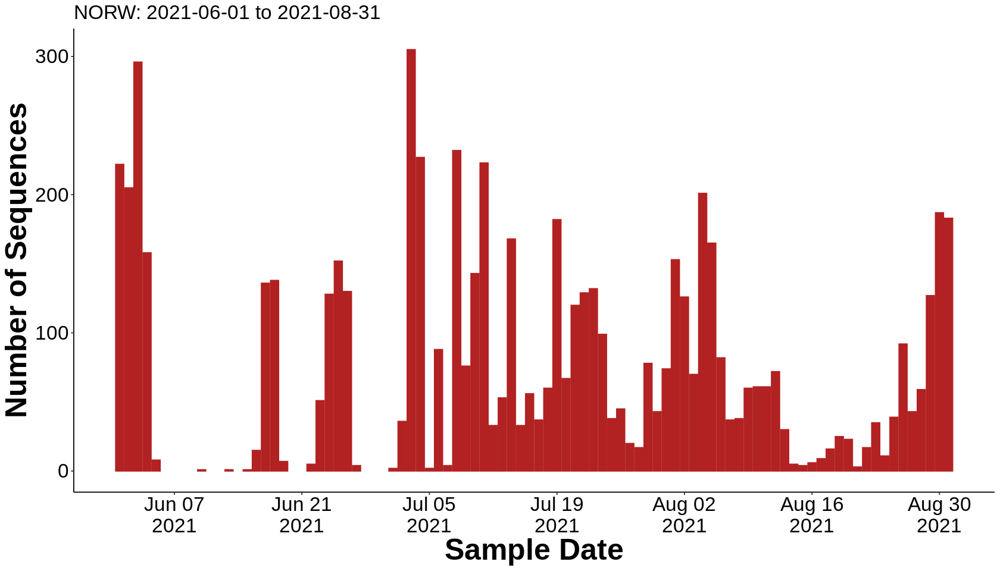

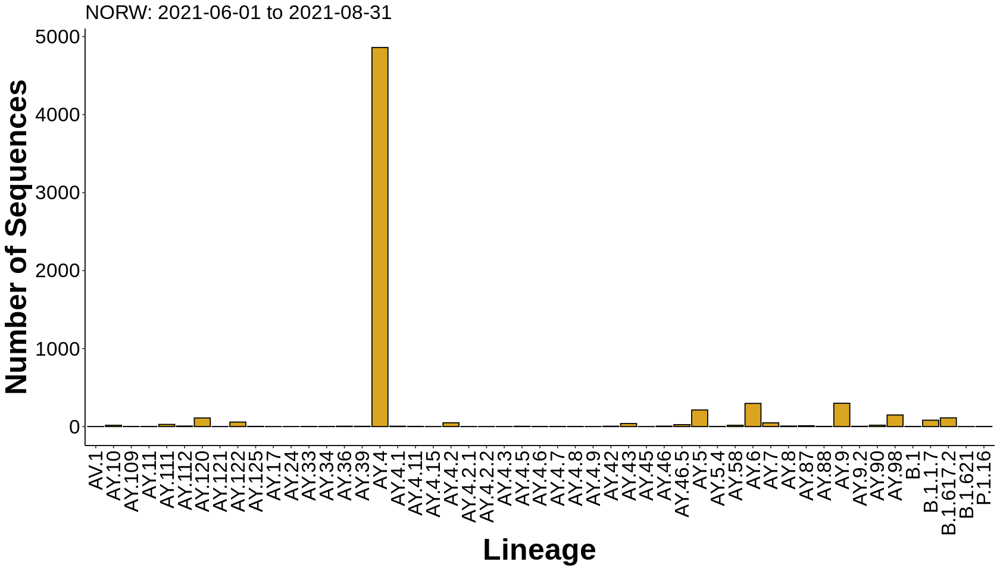

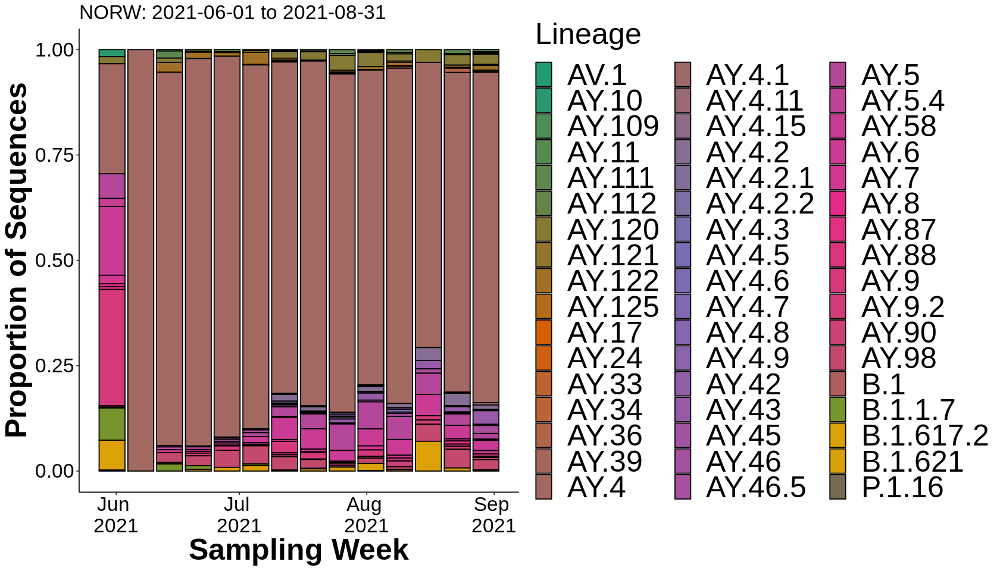

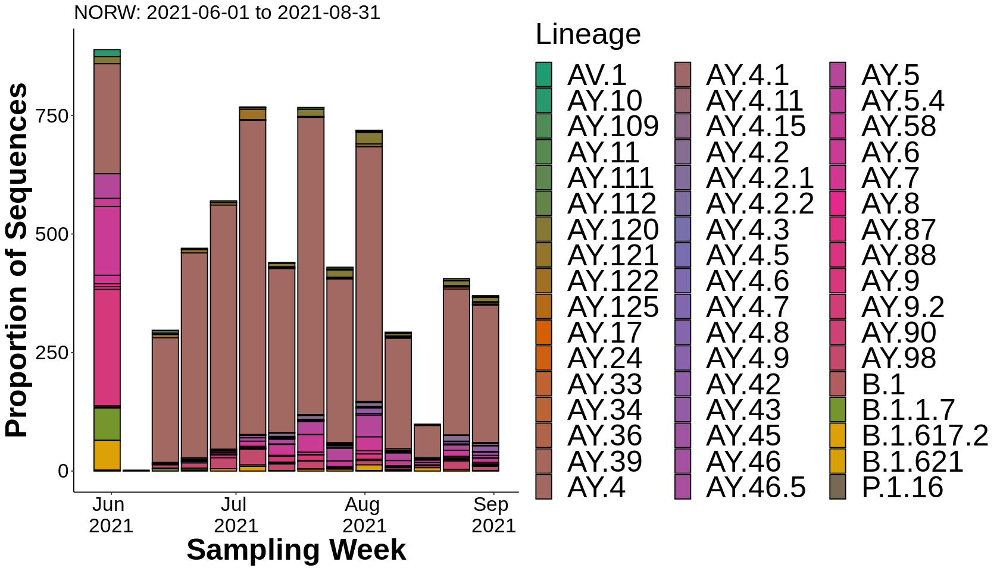

In [111]:
start = "2021-06-01"
end = "2021-08-31"

traits <- read.csv("norw_traits", sep=',')
traits$sample_date <- as.Date(traits$sample_date)
dates <- get_date_subset(start, end, traits)

dates$date2 <- as.Date(dates$date2)

plot_date_tree(dates, "NORW_tre.newick", getPal_lineage)
sequence_counts(dates, start, end, "2 weeks")
lineage_counts(dates, start, end)
lineage_time_proportions(dates, start, end, getPal_lineage)
lineage_time_counts(dates, start, end, getPal_lineage)

# CIVET tree sample distribution over time

The CIVET tree doesn't contain all the samples that are in the metadata(28722 tips out of 33411 records).  This is because CIVET runs with limited memory, so something has to go.  If the tips and metadata are compared by time, is there a pattern to which samples made it into the tree?

First plot the treetips:

[1] "Total seqs: 28722"


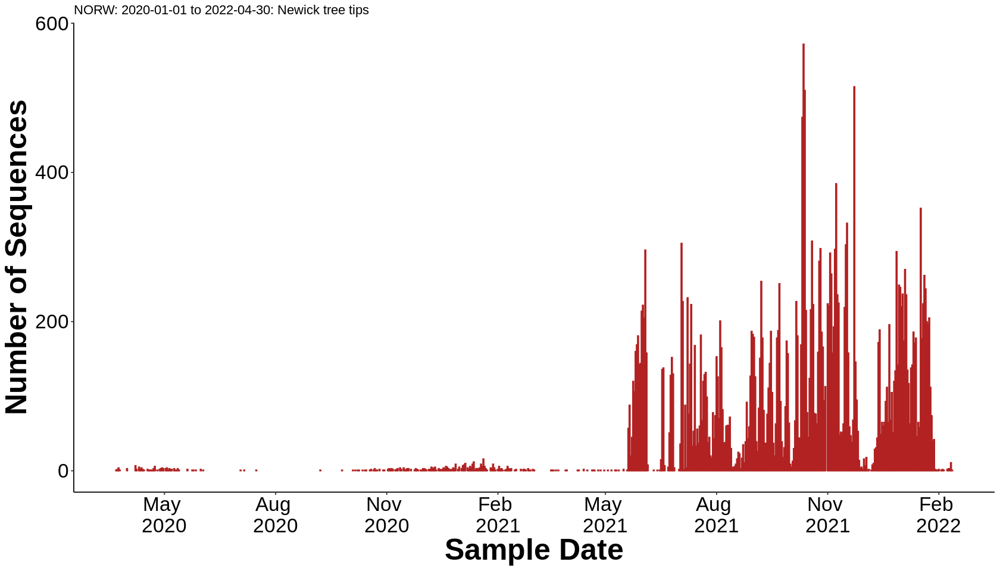

In [62]:
start_date = "2020-01-01"
end_date = "2022-04-30"

traits <- read.csv("norw_traits", sep=',')
dates <- get_date_subset(start_date, end_date, traits)

dates$sample_date <- as.Date(dates$sample_date)


options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))

print(paste0("Total seqs: ", nrow(traits))) 
p <- ggplot(dates, aes(x = sample_date)) + geom_bar(color='firebrick', fill='firebrick')
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sample Date") + ylab("Number of Sequences")
p <- p + theme(axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=20)
              )
p <- p + scale_x_date(date_labels = "%b \n%Y",date_breaks = "3 month")
p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date, ": Newick tree tips"))
p

Now plot from the original metadata (all records):

[1] "Total seqs: 33411"


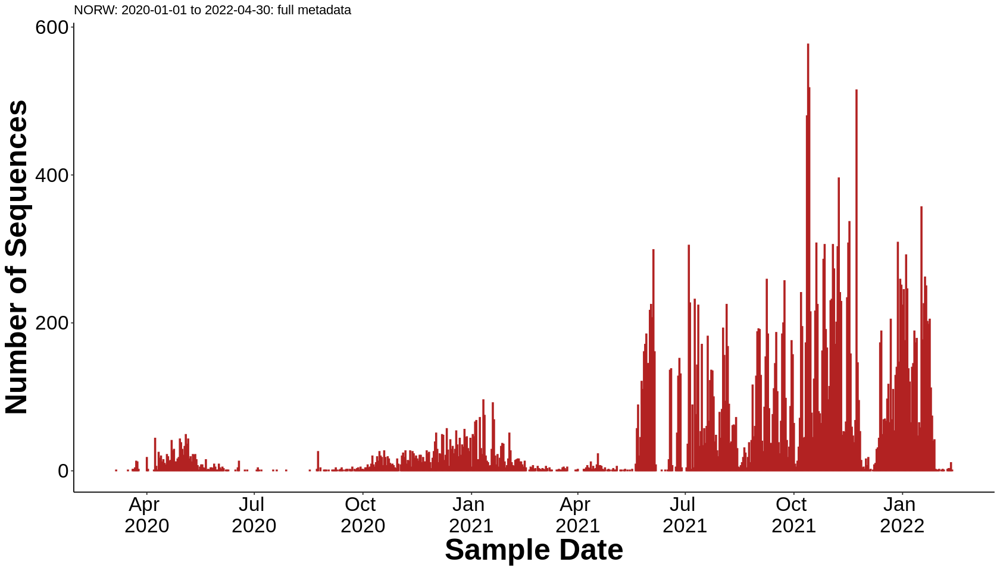

In [31]:
start_date = "2020-01-01"
end_date = "2022-04-30"

traits <- norw_meta
dates <- get_date_subset(start_date, end_date, traits)

dates$sample_date <- as.Date(dates$sample_date)


options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))

print(paste0("Total seqs: ", nrow(dates))) 
p <- ggplot(dates, aes(x = sample_date)) + geom_bar(color='firebrick', fill='firebrick')
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sample Date") + ylab("Number of Sequences")
p <- p + theme(axis.title.x = element_text(color="black", size=30, face="bold"), 
               axis.text.x = element_text(color="black", size=20),
               axis.title.y = element_text(color="black", size=30, face="bold"),
               axis.text.y = element_text(color="black", size=20),
               legend.text = element_text(size=30), legend.title = element_text(size=20)
              )
p <- p + scale_x_date(date_labels = "%b \n%Y",date_breaks = "3 month")
p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date, ": full metadata"))
p

Now plot the difference between them.  This is the same as plotting the graph for all samples that appear in `norw_meta` but not in `norw_traits.csv`.

[1] 4689   16

[1] "Total seqs: 28722"


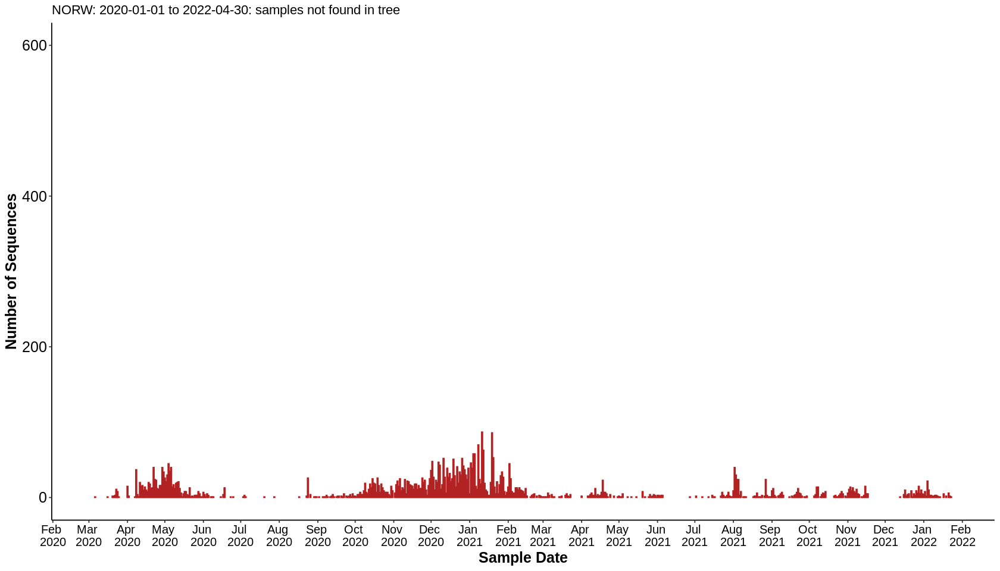

In [37]:
traits <- read.csv("norw_traits", sep=',')
#diff_seqs <- norw_meta %>% slice(match(traits$sequence_name, sequence_name)) #just save the records that appear in the tree

diff_seqs <- subset(norw_meta, !(sequence_name %in% traits$sequence_name))
dim(diff_seqs)

start_date = "2020-01-01"
end_date = "2022-04-30"

diff_seqs$sample_date <- as.Date(diff_seqs$sample_date)


options(repr.plot.width=14, repr.plot.height=8) ; par(oma=c(0,0,0,0))

print(paste0("Total seqs: ", nrow(traits))) 
p <- ggplot(diff_seqs, aes(x = sample_date)) + geom_bar(color='firebrick', fill='firebrick')
p <- p + theme_classic() + theme(axis.text.x = element_text(color="black", size=16)) + xlab("Sample Date") + ylab("Number of Sequences")
p <- p + theme(axis.title.x = element_text(color="black", size=15, face="bold"), 
               axis.text.x = element_text(color="black", size=12),
               axis.title.y = element_text(color="black", size=15, face="bold"),
               axis.text.y = element_text(color="black", size=15),
               legend.text = element_text(size=16), legend.title = element_text(size=20)
              )
p <- p + scale_x_date(date_labels = "%b \n%Y",date_breaks = "1 month")
p <- p + labs(title = paste0("NORW: ", start_date, " to ", end_date, ": samples not found in tree"))
p <- p + ylim(0, 600)
p

It can be seen that the first two waves are missing from the tree.  This makes sense because the CIVET tree is used to classify new samples, so it should be biased towards later things.

# Looking for waves to potentially make trees for

[1] "Total seqs: 353"
[1] "Total seqs: 1658"


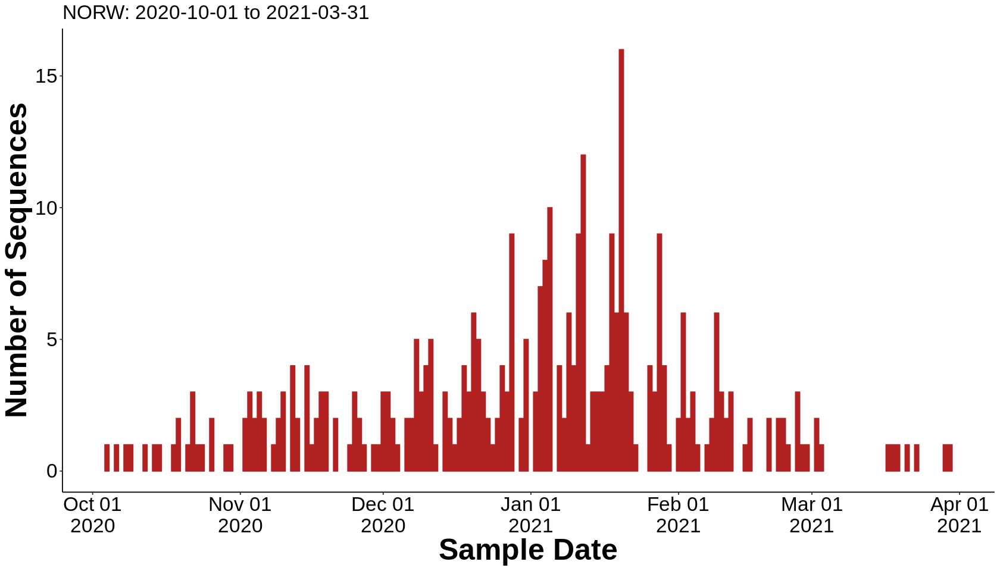

[1] "Total seqs: 8076"


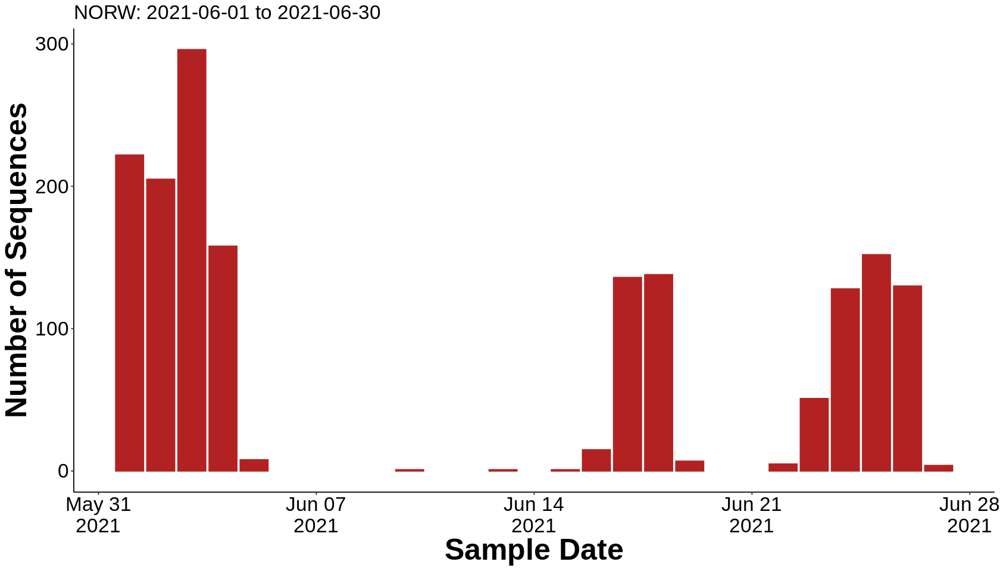

[1] "Total seqs: 8281"


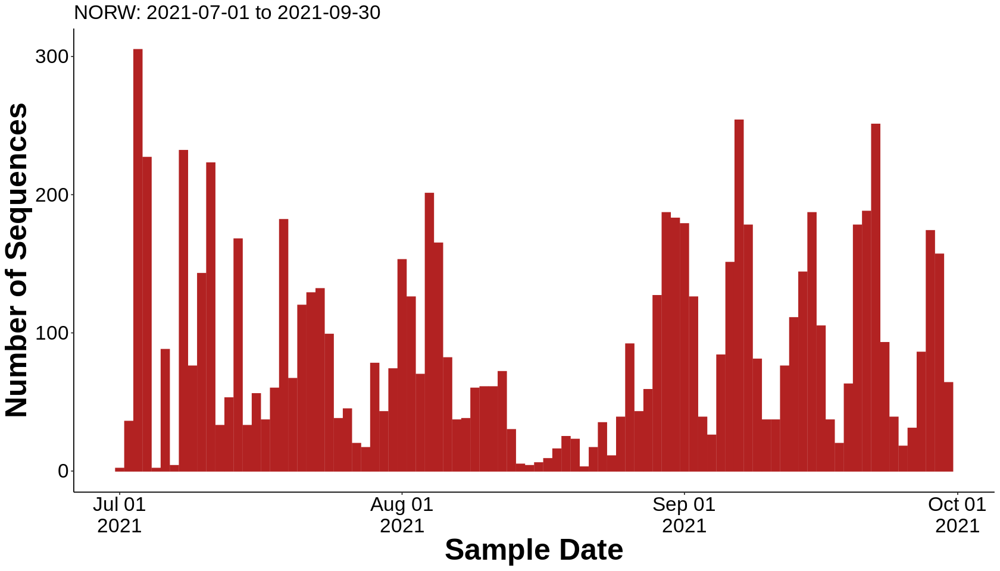

[1] "Total seqs: 12476"


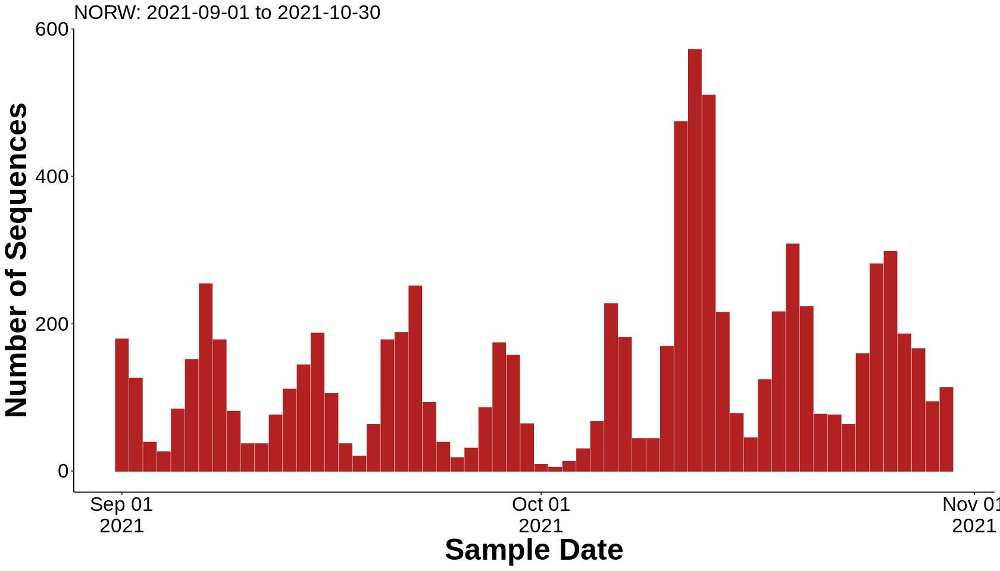

[1] "Total seqs: 7211"


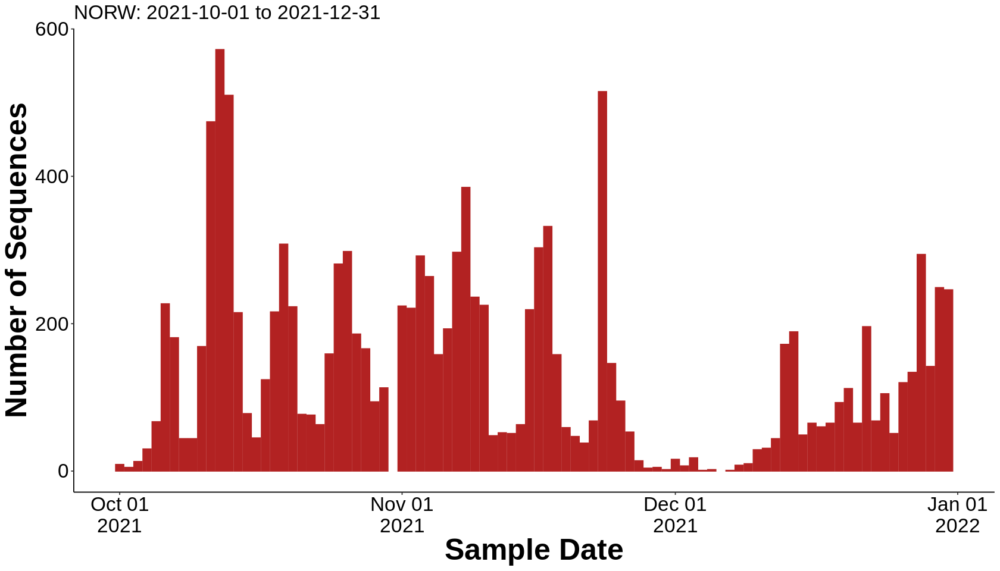

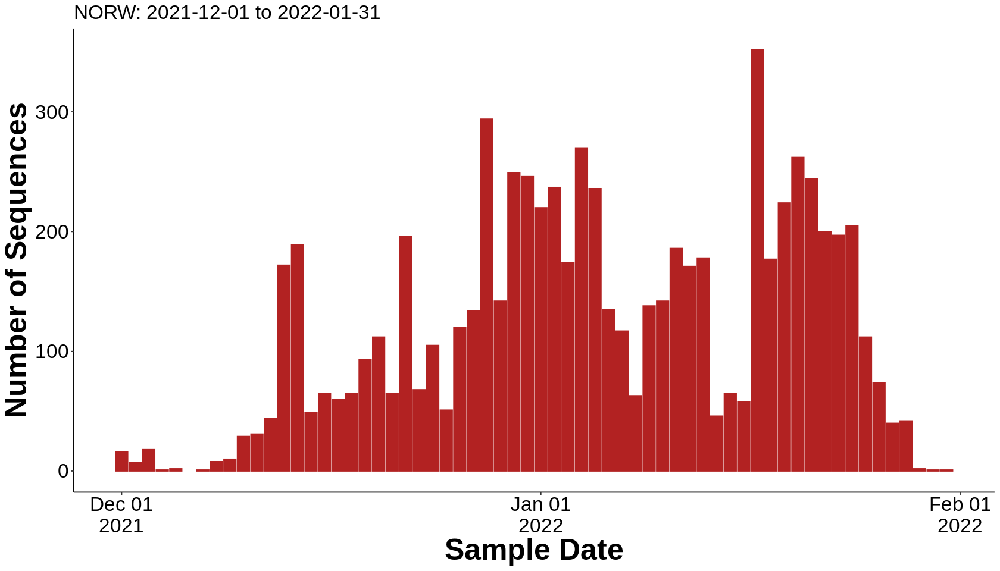

In [116]:
traits <- read.csv("norw_traits", sep=',')

#October 2020 to March 2021
start = "2020-10-01"
end = "2021-03-31"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 month")

#June 2021
start = "2021-06-01"
end = "2021-06-30"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 week")

#Jul-Sep 2021
start = "2021-07-01"
end = "2021-09-30"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 month")

#Sep-Oct 2021
start = "2021-09-01"
end = "2021-10-30"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 month")

#Oct-Dec 2021
start = "2021-10-01"
end = "2021-12-31"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 month")

#Dec 15 2021-March 2022
start = "2021-12-01"
end = "2022-01-31"

dates <- get_date_subset(start, end, traits)
sequence_counts(dates, start, end, "1 month")